In [9]:
import torch
import numpy as np
from torchvision.datasets import CIFAR10,Flowers102
import matplotlib.pyplot as plt
from lib import forward_diffusion, reverse_diffusion, DDPM, make_schedule
from unet import UNetModel
from torchvision.transforms import ToTensor, Compose, PILToTensor, Normalize, Resize
import os
from PIL import Image

In [10]:
#Download Flowers102
#flowers102_dataset_root = '/mimer/NOBACKUP/groups/azizpour-group-alvis/bharath/datasets/flowers102'
#flowers102_dataset = Flowers102(root=flowers102_dataset_root, download=True)

N=1020 train samples in flowers102


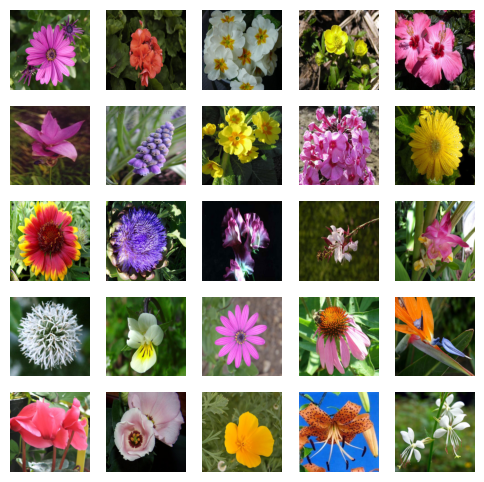

In [11]:
#Visualize Flowers102 images
flowers102_dataset_root = '/mimer/NOBACKUP/groups/azizpour-group-alvis/bharath/datasets/flowers102'
flowers102_train_dataset_orig = Flowers102(root=flowers102_dataset_root, download=False, split='train', transform=Compose([Resize(size=(256,256))]))
N = len(flowers102_train_dataset_orig)
print(f"N={N} train samples in flowers102")
num_samples = 25
h, w = int(np.sqrt(num_samples)), int(np.sqrt(num_samples))
assert h*w == num_samples
f, ax = plt.subplots(ncols=w, nrows=h, figsize=(1.2*w,1.2*h))
samples = np.random.choice(np.arange(N),size=num_samples)
for id, sample in enumerate(samples):
    (image, target) = flowers102_train_dataset_orig[sample]
    image = np.array(image)
    #print(image.shape)
    r = id//w
    c = id - (r*w)
    ax[r,c].imshow(image)
    ax[r,c].axis('off')

Text(0.5, 0, 'rvar')

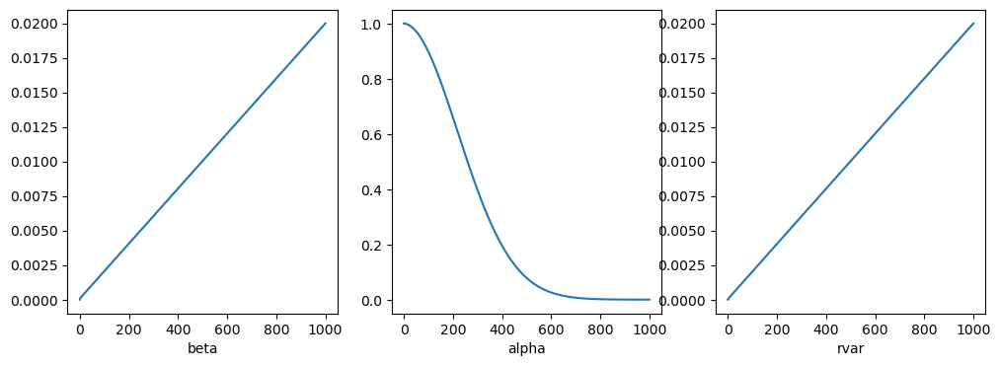

In [12]:
T = 1000
schedule = make_schedule(scheme='linear', rvar='fvar', T=T, start_beta=1e-4, end_beta=0.02)
f, ax = plt.subplots(ncols=3,figsize=(12,4))
ax[0].plot(np.arange(start=0,stop=T+1),schedule['beta'])
ax[0].set_xlabel('beta')
ax[1].plot(np.arange(start=0,stop=T+1),schedule['alpha'])
ax[1].set_xlabel('alpha')
ax[2].plot(np.arange(start=0,stop=T+1),schedule['rvar'])
ax[2].set_xlabel('rvar')
#print(schedule['alpha'])

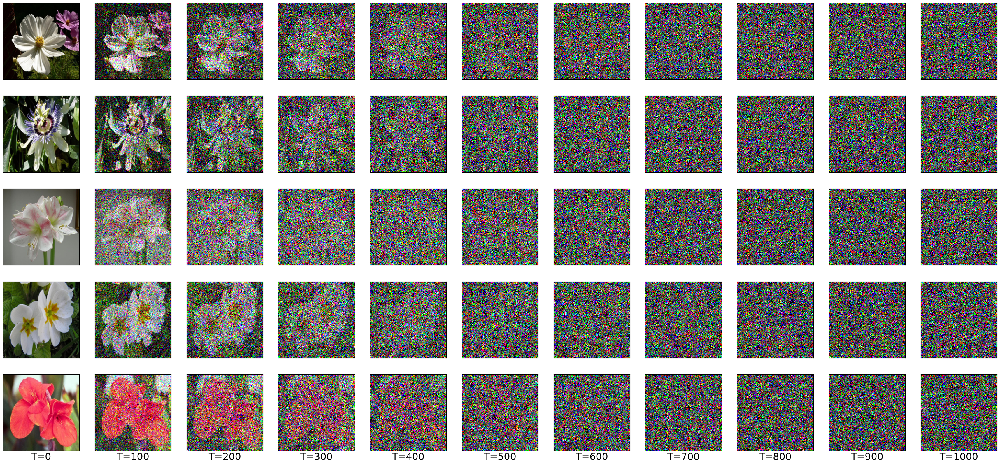

In [13]:
numtime = 11
numsamples = 5
f, ax = plt.subplots(ncols=numtime, nrows=numsamples, figsize=(4*numtime,4*numsamples))
samples = np.random.choice(np.arange(len(flowers102_train_dataset_orig)),size=numsamples)
for idx,t in enumerate(np.linspace(start=0, stop=T, endpoint=True, num=numtime)):
    t = int(t)
    for idy, sample in enumerate(samples):
        (image, target) = flowers102_train_dataset_orig[sample]
        image = np.array(image, dtype=np.float32)/255.0
        #image = np.array(image)
        image_t = forward_diffusion(image, 0, t, schedule)
        ax[idy, idx].imshow(np.asarray(np.clip(image_t*255,a_min=0,a_max=255),dtype=np.uint8))    
        #ax[idy, idx].set_xlabel('T='+str(t))
        ax[idy, idx].set_xticks([])
        ax[idy, idx].set_yticks([])
        if idy == len(samples)-1:
            ax[idy, idx].set_xlabel('T='+str(t), fontsize=24)

In [15]:
class unet_flowers_classic(torch.nn.Module):
    
    def __init__(self,):
        super().__init__()
        self.model = UNetModel(image_size=256,
                            in_channels=3,
                            model_channels=32,
                            out_channels=3,
                            num_res_blocks=4,
                            attention_resolutions=[4,16],
                            dropout=0,
                            channel_mult=(1, 2, 2, 4, 4),
                            conv_resample=True,
                            dims=2,
                            num_classes=None,
                            use_checkpoint=False,
                            use_fp16=False,
                            num_heads=1,
                            num_head_channels=-1,
                            num_heads_upsample=-1,
                            use_scale_shift_norm=False,
                            resblock_updown=False,
                            use_new_attention_order=False)

    def forward(self, x, t):
        return self.model(x, t)

def train(ddpm_model, num_epochs, batch_size, savefreq, prefix):
    optimizer = torch.optim.Adam(ddpm_model.model.parameters(),lr=1e-4)
    train_dataset = Flowers102(root=flowers102_dataset_root, download=False, split='train', transform=Compose([Resize(size=(256,256)), ToTensor(), Normalize(mean=[0.5,0.5,0.5],std=[0.5,0.5,0.5])  ]))
    dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    for epoch in range(1,num_epochs+1):
        LOSS = 0
        ITER = 0
        for data in dataloader:
            data_x, data_y = data
            optimizer.zero_grad()
            loss = ddpm_model.run_step(data_x)
            loss.backward()
            optimizer.step()
            LOSS += loss.item()
            ITER += 1
        print(f"epoch = {epoch}, loss = {LOSS/ITER}")  
        if epoch % savefreq == 0:
            if not os.path.exists('./ckpts'):
                os.mkdir('ckpts')
            D = {'model_state_dict': ddpm_model.model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'epoch': epoch }
            torch.save(D,'ckpts/'+prefix+'-'+str(epoch)+'.ckpt')  

def infer(ddpm_model, schedule, num_samples):
    
    z = np.random.normal(loc=0, scale=1.0, size=(num_samples,3,256,256))
    z = np.asarray(z, dtype=np.float32)
    x = z
    for t in range(0,T):
        x = reverse_diffusion(ddpm_model=ddpm_model, x=x, t_curr=T-t, cuda=True, schedule=schedule, onlymean=False)
    pred_samples = x
    assert pred_samples.shape == z.shape
    h, w = int(np.sqrt(num_samples)), int(np.sqrt(num_samples))
    assert h*w == num_samples
    f, ax = plt.subplots(ncols=w, nrows=h, figsize=(1.2*w,1.2*h))
    for id in range(num_samples):
        image  = pred_samples[id]
        image = np.transpose(image,(1,2,0))
        image = (1.0 + image)*0.5*255 
        image = np.clip(image, a_min=0, a_max=255)
        image = np.asarray(image, dtype=np.uint8)
        r = id//w
        c = id - (r*w)
        ax[r,c].imshow(image)
        ax[r,c].axis('off')



In [16]:
model = unet_flowers_classic()
#model.load_state_dict(torch.load('./ckpts/flowers102-uwl-200.ckpt')['model_state_dict'])
ddpm_model = DDPM(schedule=schedule,model=model,weightedloss=False,cuda=True)
train(ddpm_model, num_epochs=200, batch_size=32, savefreq=50, prefix='flowers102-uwl')

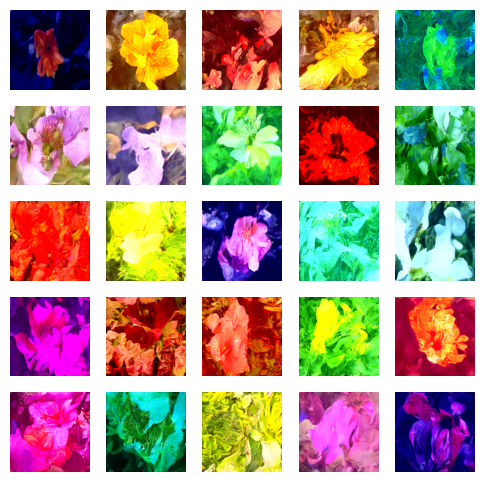

In [17]:
infer(ddpm_model, schedule, num_samples=25)